<a href="https://colab.research.google.com/github/thanhphap059/Nhandienthucung/blob/main/AI_THUCUNG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
# Link Github: https://github.com/thanhphap059/Nhandienthucung.git

# Nguyễn Thanh Pháp MSSV 19146230 
# Khai báo thư viện
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
import numpy as np
import tensorflow as tf
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.optimizers import SGD, RMSprop
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.utils import validation 
from sklearn import preprocessing
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [5]:
#Chuyển đến thư mục có chứa hình ảnh thú cưng
%cd /content/drive/MyDrive/Colab Notebooks/THUCUNG

/content/drive/MyDrive/Colab Notebooks/THUCUNG


In [6]:
# Tạo ra class ImageDataGenerator 
train_datagen=ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)

In [7]:
# Tạo bộ dữ liệu training set
training_set=train_datagen.flow_from_directory('/content/drive/MyDrive/Colab Notebooks/THUCUNG/Train',target_size=(150,150), batch_size=32, class_mode='categorical')

Found 2879 images belonging to 20 classes.


In [8]:
# Tạo bộ dữ liệu validation
validation=train_datagen.flow_from_directory('/content/drive/MyDrive/Colab Notebooks/THUCUNG/Validation',target_size=(150,150), batch_size=32, class_mode='categorical')

Found 806 images belonging to 20 classes.


In [9]:
# Các nhãn có trong bộ dữ liệu training set
training_set.class_indices

{'Ca Betta': 0,
 'Ca Hai Tuong': 1,
 'Chao Mao': 2,
 'Cho Alaska': 3,
 'Cho Poodle': 4,
 'Chuot Hamster': 5,
 'Cong': 6,
 'Dai Bang': 7,
 'Ga Tre Canh': 8,
 'Heo': 9,
 'Khi Duoi Soc': 10,
 'Meo Munchkin': 11,
 'Nhen Tarantula': 12,
 'Nhim Kieng': 13,
 'Ran Ngo': 14,
 'Rua': 15,
 'Soc Kieng': 16,
 'Tac Ke': 17,
 'Tho': 18,
 'Vet': 19}

In [10]:
# Các nhãn có trong bộ dữ liệu validation
validation.class_indices

{'Ca Betta': 0,
 'Ca Hai Tuong': 1,
 'Chao Mao': 2,
 'Cho Alaska': 3,
 'Cho Poodle': 4,
 'Chuot Hamster': 5,
 'Cong': 6,
 'Dai Bang': 7,
 'Ga Tre Canh': 8,
 'Heo': 9,
 'Khi Duoi Soc': 10,
 'Meo Munchkin': 11,
 'Nhen Tarantula': 12,
 'Nhim Kieng': 13,
 'Ran Ngo': 14,
 'Rua': 15,
 'Soc Kieng': 16,
 'Tac Ke': 17,
 'Tho': 18,
 'Vet': 19}

In [11]:
# Tạo ra mạng CNN để train mô hình
model=Sequential()
# Tích chập 32 lần với mỗi lần là 3 hàng 3 cột
model.add(Conv2D(32,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same',input_shape=(150,150,3))) 
model.add(Conv2D(32,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
# Lấy phần tử lớn nhất ở trong 2 hàng và 2 cột
model.add(MaxPooling2D(2,2))
# Tích chập 64 lần với mỗi lần là 3 hàng 3 cột
model.add(Conv2D(64,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same')) 
model.add(Conv2D(64,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
# Lấy phần tử lớn nhất ở trong 2 hàng và 2 cột
model.add(MaxPooling2D(2,2))
# Tích chập 128 lần với mỗi lần là 3 hàng 3 cột
model.add(Conv2D(128,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same')) 
model.add(Conv2D(128,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
# Lấy phần tử lớn nhất ở trong 2 hàng và 2 cột
model.add(MaxPooling2D(2,2))
# Tích chập 256 lần với mỗi lần là 3 hàng 3 cột
model.add(Conv2D(256,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same')) 
model.add(Conv2D(256,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
# Lấy phần tử lớn nhất ở trong 2 hàng và 2 cột
model.add(MaxPooling2D(2,2))
# Duỗi thẳng dữ liệu 
model.add(Flatten())
# Tạo lớp ẩn thứ nhất với 128 tín hiệu ra
model.add(Dense(512,activation='relu',kernel_initializer='he_uniform'))
model.add(Dropout(0.2))
model.add(Dense(128,activation='relu',kernel_initializer='he_uniform'))
model.add(Dropout(0.2))
# Tạo lớp ẩn thứ hai với 20 tín hiệu ra
model.add(Dense(20,activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 32)       0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 75, 75, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 75, 75, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 37, 37, 64)       0         
 2D)                                                    

In [12]:
# Biên dịch 
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
# Gán biến lại để vẽ đồ thị, với 100 lần học (epochs), mỗi lần học thì chỉ học 64 dữ liệu (batch_size), khi sai số không thay đổi trong 20 lần học thì sẽ␣ dừng học 
history=model.fit(training_set,epochs=100,batch_size=64,verbose=1, validation_data=validation, callbacks=[EarlyStopping(monitor='val_loss', patience=20)])

Epoch 1/100
90/90 [==============================] - 785s 9s/step - loss: 3.0003 - accuracy: 0.0788 - val_loss: 2.9738 - val_accuracy: 0.0844
Epoch 2/100
90/90 [==============================] - 58s 642ms/step - loss: 2.8788 - accuracy: 0.1153 - val_loss: 2.8039 - val_accuracy: 0.1141
Epoch 3/100
90/90 [==============================] - 59s 652ms/step - loss: 2.7644 - accuracy: 0.1469 - val_loss: 2.6624 - val_accuracy: 0.1725
Epoch 4/100
90/90 [==============================] - 57s 638ms/step - loss: 2.6341 - accuracy: 0.1966 - val_loss: 2.5989 - val_accuracy: 0.2097
Epoch 5/100
90/90 [==============================] - 58s 647ms/step - loss: 2.5292 - accuracy: 0.2188 - val_loss: 2.4463 - val_accuracy: 0.2556
Epoch 6/100
90/90 [==============================] - 58s 646ms/step - loss: 2.4274 - accuracy: 0.2546 - val_loss: 2.3096 - val_accuracy: 0.3102
Epoch 7/100
90/90 [==============================] - 59s 659ms/step - loss: 2.2893 - accuracy: 0.2966 - val_loss: 2.1395 - val_accuracy: 0

In [13]:
# Đánh giá độ chính xác của mô hình 
Score=model.evaluate(training_set,verbose=0)
print('Train Loss', Score[0])
print('Train Accuracy', Score[1])

Train Loss 0.032172009348869324
Train Accuracy 0.9916637539863586


<function matplotlib.pyplot.show>

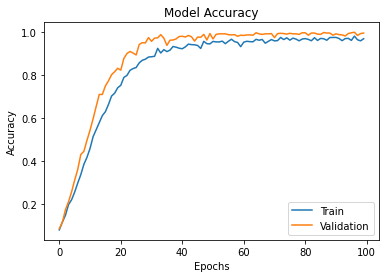

In [14]:
# Vẽ đồ thị giữa số lần học (Epochs) và độ chính xác (Accuracy)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Train','Validation'])
plt.show

In [15]:
# Lưu lại
model.save("thucung.h5")

In [16]:
# Tải mô hình 
model_CNN=load_model('thucung.h5')

Cong


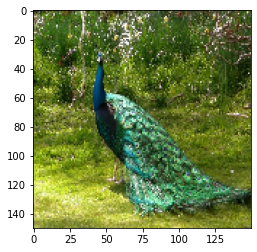

Nhen Tarantula


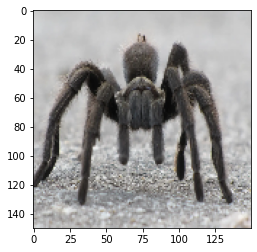

Cong


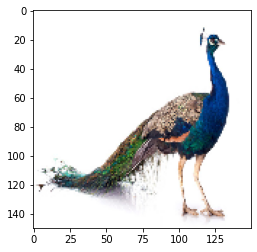

Nhen Tarantula


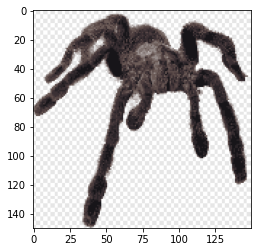

Chuot Hamster


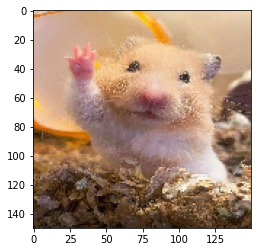

Ca Betta


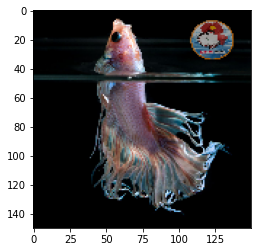

Cong


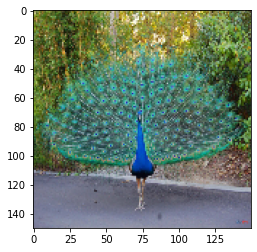

Chuot Hamster


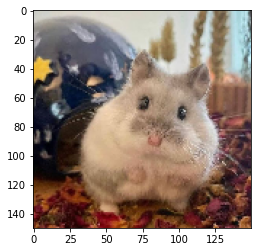

Chuot Hamster


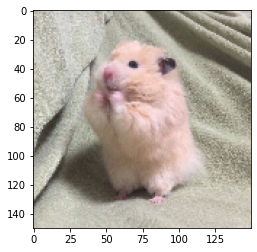

Chuot Hamster


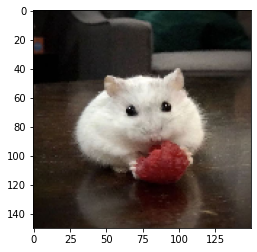

Ca Hai Tuong


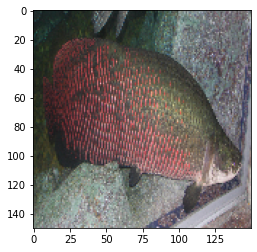

Cho Poodle


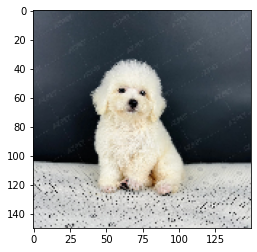

Cho Poodle


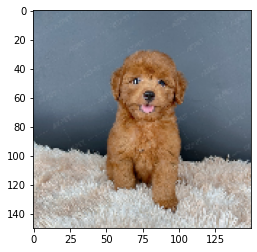

Cho Poodle


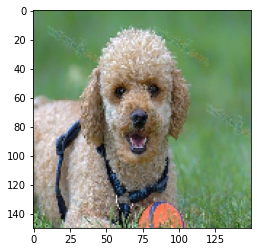

Chuot Hamster


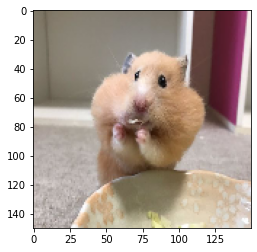

Cho Poodle


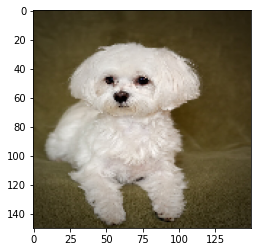

Meo Munchkin


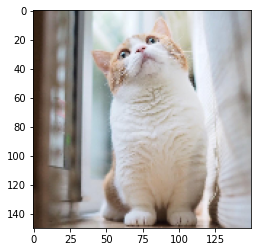

Meo Munchkin


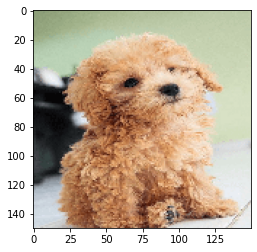

Soc Kieng


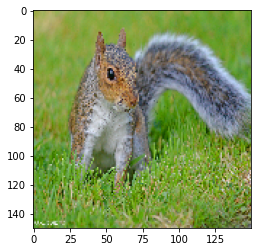

Cho Alaska


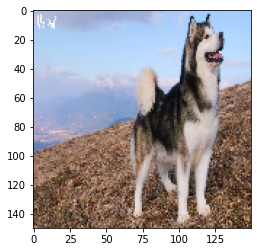

Cho Alaska


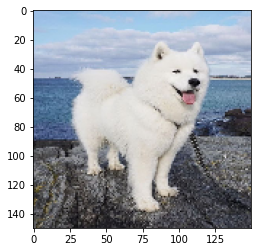

Cho Alaska


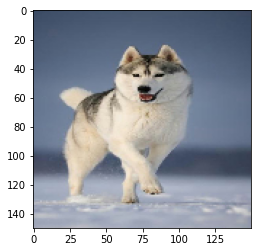

Cho Alaska


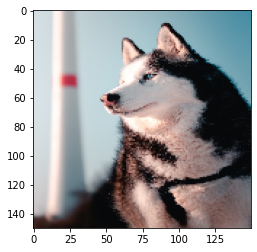

Chao Mao


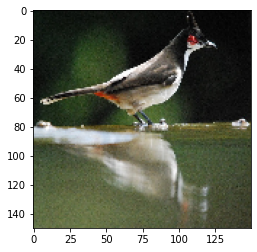

Chao Mao


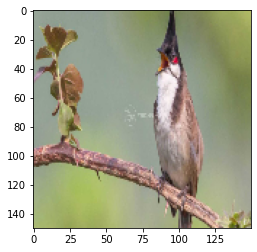

Cho Alaska


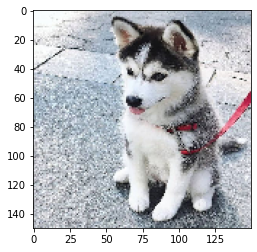

Chao Mao


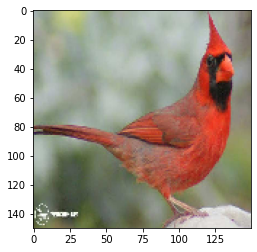

Chao Mao


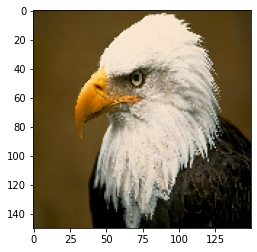

Chao Mao


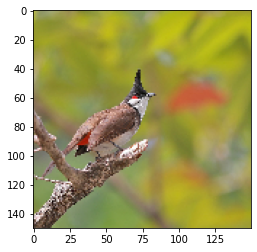

Ca Betta


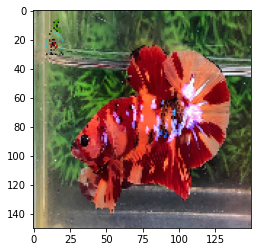

Ca Hai Tuong


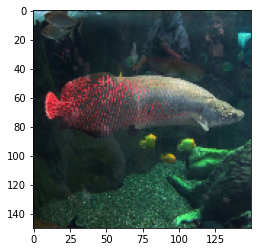

Chao Mao


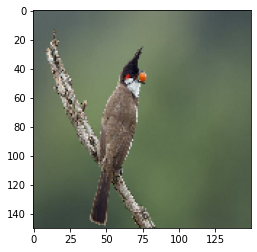

Ca Betta


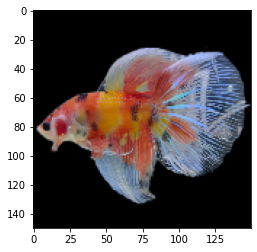

Rua


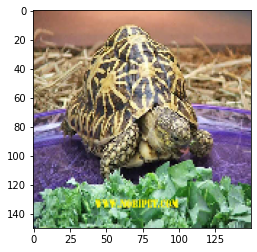

Rua


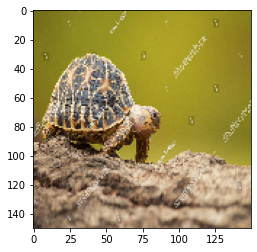

Rua


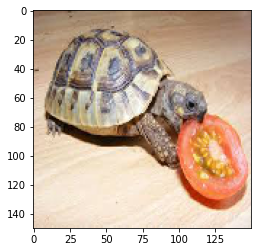

Nhim Kieng


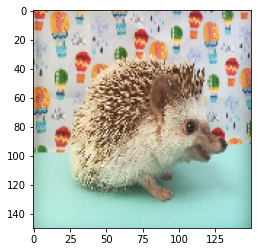

Ran Ngo


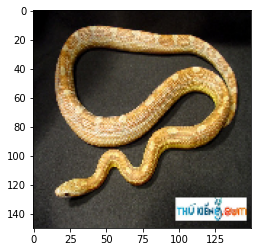

Ran Ngo


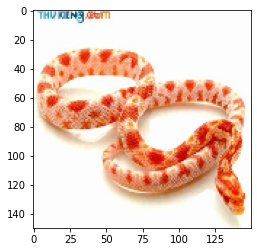

Ran Ngo


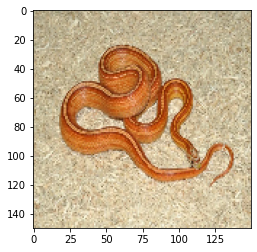

Nhim Kieng


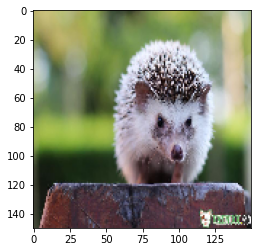

Ca Hai Tuong


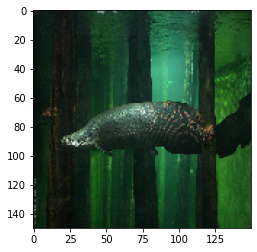

Nhim Kieng


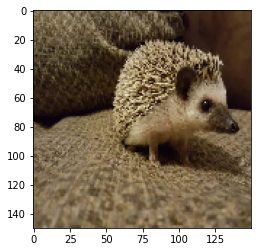

Nhim Kieng


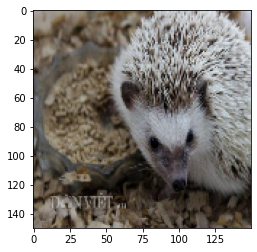

Nhim Kieng


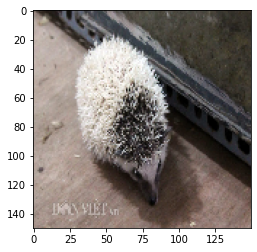

Nhen Tarantula


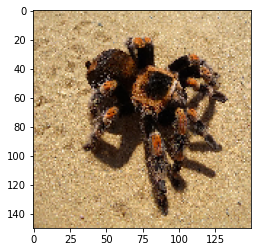

Soc Kieng


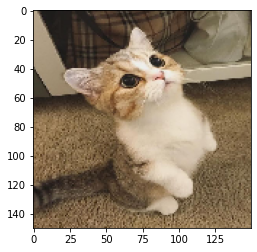

Meo Munchkin


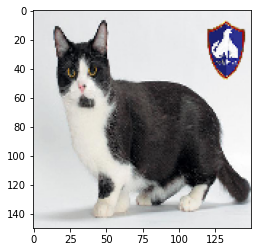

Nhen Tarantula


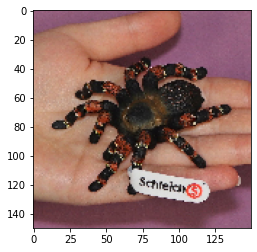

Cho Poodle


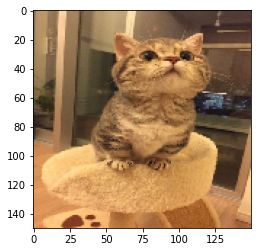

Heo


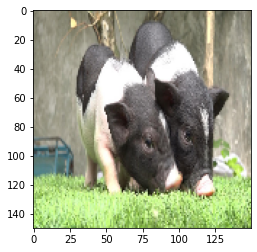

Ca Betta


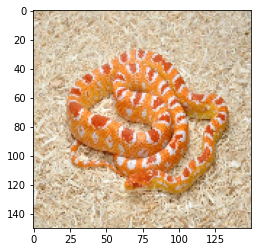

Ca Betta


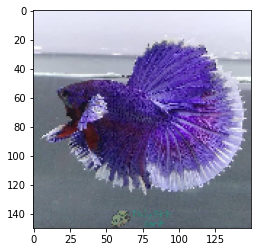

Heo


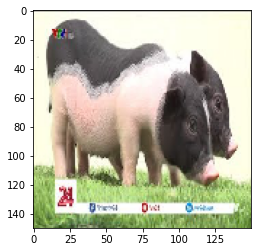

Heo


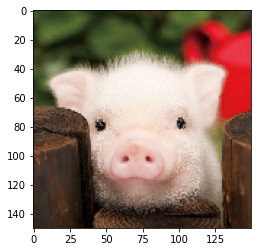

Heo


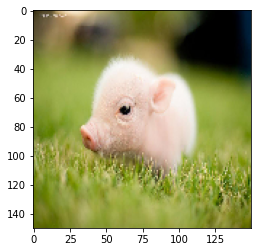

Khi Duoi Soc


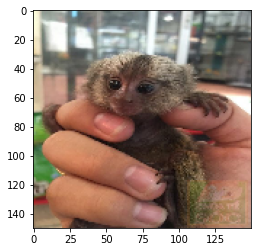

Khi Duoi Soc


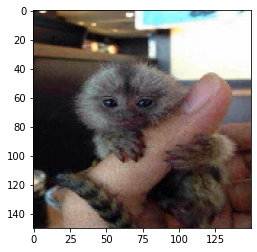

Ga Tre Canh


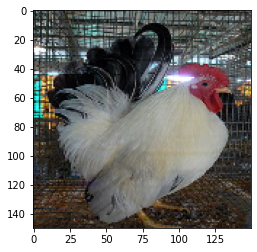

Khi Duoi Soc


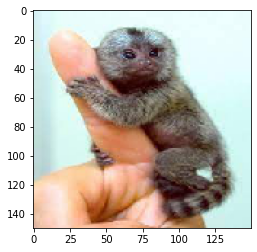

Khi Duoi Soc


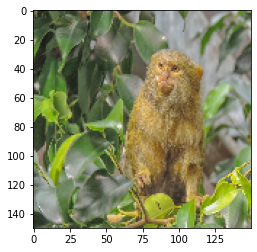

Ga Tre Canh


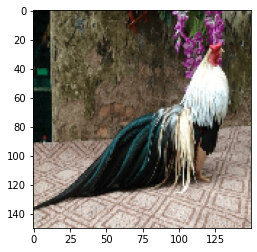

Ga Tre Canh


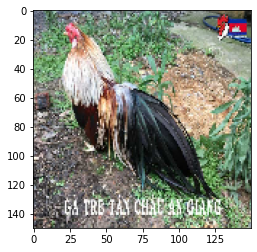

Nhen Tarantula


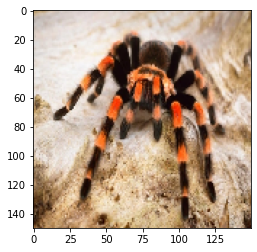

Ca Betta


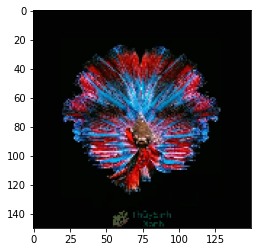

Ga Tre Canh


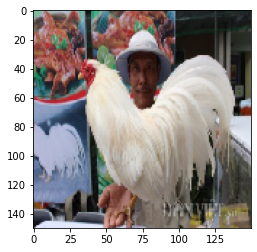

Ga Tre Canh


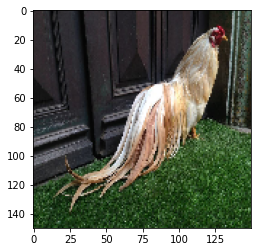

Dai Bang


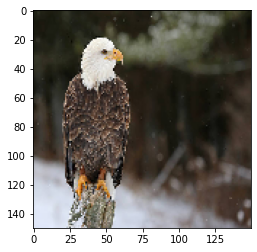

Tac Ke


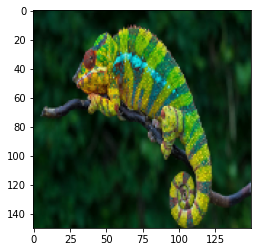

Dai Bang


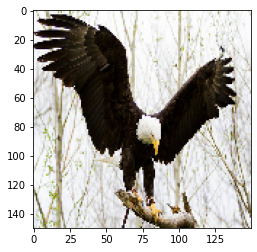

Dai Bang


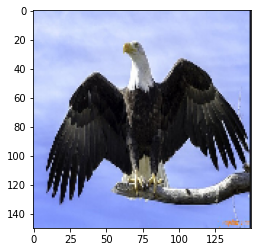

Dai Bang


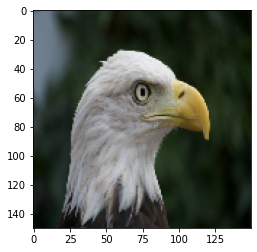

Cong


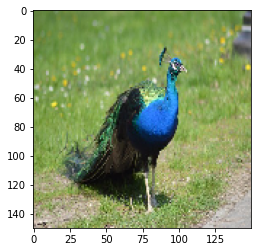

Cong


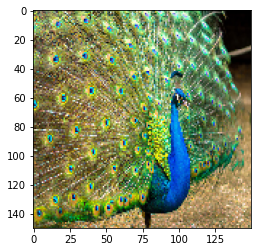

Tho


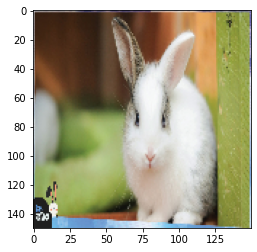

Tho


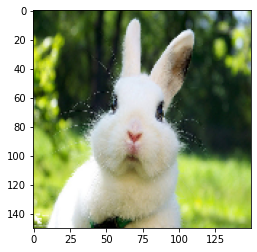

Rua


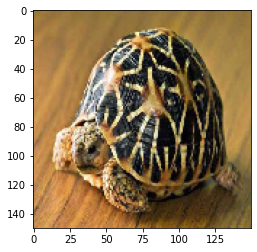

Rua


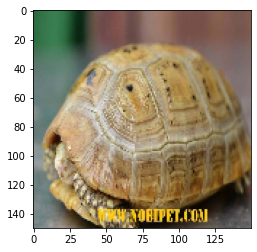

Tac Ke


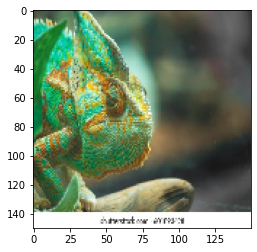

Tac Ke


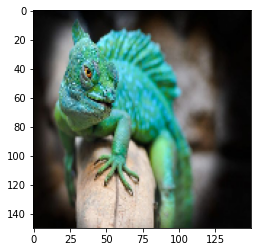

Tac Ke


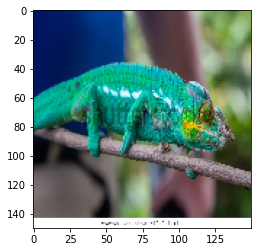

Tho


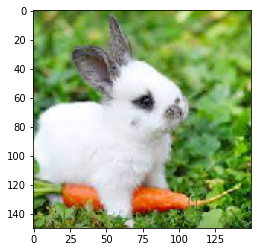

Tho


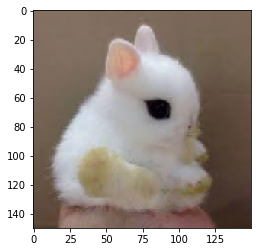

Tho


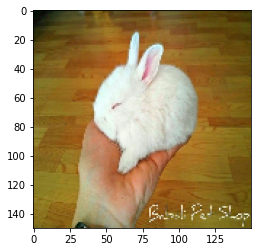

Soc Kieng


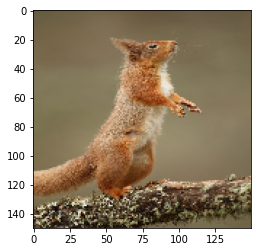

Soc Kieng


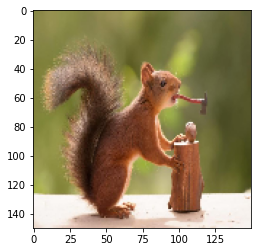

Soc Kieng


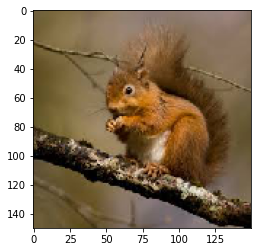

Soc Kieng


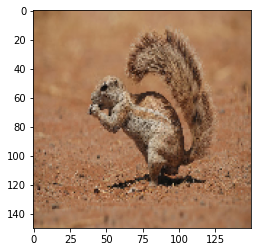

Ca Hai Tuong


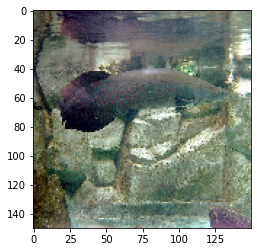

Ca Hai Tuong


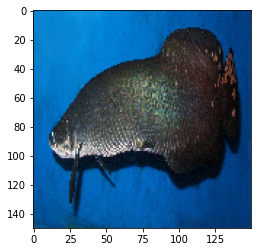

In [21]:
test="/content/drive/MyDrive/Colab Notebooks/THUCUNG/Test/Test3"
for i in os.listdir(test):
  img=load_img(test+'/'+i,target_size=(150,150))
  plt.imshow(img)
  img=img_to_array(img)
  img=img.astype('float32')
  img=img/255
  img=np.expand_dims(img,axis=0)
  result=model_CNN.predict(img)
  if round(result[0][0])==1:
    prediction='Ca Betta'
  if round(result[0][1])==1:
    prediction='Ca Hai Tuong'
  if round(result[0][2])==1:
    prediction='Chao Mao'
  if round(result[0][3])==1:
    prediction='Cho Alaska'
  if round(result[0][4])==1:
    prediction='Cho Poodle'
  if round(result[0][5])==1:
    prediction='Chuot Hamster'
  if round(result[0][6])==1:
    prediction='Cong'
  if round(result[0][7])==1:
    prediction='Dai Bang'
  if round(result[0][8])==1:
    prediction='Ga Tre Canh'
  if round(result[0][9])==1:
    prediction='Heo'
  if round(result[0][10])==1:
    prediction='Khi Duoi Soc'
  if round(result[0][11])==1:
    prediction='Meo Munchkin'
  if round(result[0][12])==1:
    prediction='Nhen Tarantula'
  if round(result[0][13])==1:
    prediction='Nhim Kieng'
  if round(result[0][14])==1:
    prediction='Ran Ngo'
  if round(result[0][15])==1:
    prediction='Rua'
  if round(result[0][16])==1:
    prediction='Soc Kieng'
  if round(result[0][17])==1:
    prediction='Tac Ke'
  if round(result[0][18])==1:
    prediction='Tho'
  if round(result[0][19])==1:
    prediction='Vet'
  print(prediction)
  plt.show()
